# Projekt analizy jakości wina

#### Autorzy: Miłosz Mertka 319074, Sebastian Grosfeld 319041

Celem projektu było dokonanie analizy eksploracyjnej dwóch zbiorów danych reprezentujących różne czerwone i białe wina oraz przeprowadzenie klasyfikacji z użyciem metod uczenia maszynowego. Model uczenia maszynowego powinien potrafić dokonać klasyfikacji wina do odpowiedniej kategorii oznaczającej jego jakość.

In [1]:
# import niezbędnych pakietów
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics

In [2]:
# wczytanie zbiorów danych z plików csv
red_wines = pd.read_csv("winequality-red.csv", delimiter=";")
white_wines = pd.read_csv("winequality-white.csv", delimiter=";")

In [3]:
red_wines.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
white_wines.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


## Analiza eksploracyjna

### Struktura zbioru

In [4]:
rows_count = red_wines.shape[0]
columns_count = red_wines.shape[1]

# uzyskanie liczby brakujących danych
missing_data_count = red_wines.isna().sum().sum()

print(f"Liczba wierszy w zbiorze win czerwonych: {rows_count}")
print(f"Liczba kolumn w zbiorze win czerwonych: {columns_count}")
print(f"Liczba brakujących danych: {missing_data_count}")

print("\n")
red_wines.info()

Liczba wierszy w zbiorze win czerwonych: 1599
Liczba kolumn w zbiorze win czerwonych: 12
Liczba brakujących danych: 0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


Na początek sprawdziliśmy strukturę ramki danych dla zbioru **win czerwonych**. Ramka posiada **11 kolumn** i **1599 wierszy**. 10 atrybutów jest opisowych i każdy z nich jest **typu rzeczywistego**. W zbiorze nie ma żadnych braków danych. Nie ma zatem potrzeby usuwania lub uzupełniania danych brakujących.
Jedenasty atrybut określa jakość wina. Jest to atrybut decyzyjny typu liczby całkowitej. Atrybut *quality* zostanie wykorzystany przez nas w procesie uczenia nadzorowanego.

In [5]:
rows_count = white_wines.shape[0]
columns_count = white_wines.shape[1]

# uzyskanie liczby brakujących danych
missing_data_count = red_wines.isna().sum().sum()

print(f"Liczba wierszy w zbiorze win białych: {rows_count}")
print(f"Liczba kolumn w zbiorze win białych: {columns_count}")
print(f"Liczba brakujących danych: {missing_data_count}")

print("\n")
white_wines.info()

Liczba wierszy w zbiorze win białych: 4898
Liczba kolumn w zbiorze win białych: 12
Liczba brakujących danych: 0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


Następnie sprawdziliśmy strukturę ramki danych dla zbioru **win białych**. Ramka posiada **11 kolumn** i **4898 wierszy**. Podobnie jak w przypadku **win czerwonych** 10 atrybutów jest opisowych i każdy z nich jest **typu rzeczywistego**. W zbiorze nie ma żadnych braków danych. Nie ma zatem potrzeby usuwania lub uzupełniania danych brakujących. Jedenasty atrybut określa jakość wina. Jest to atrybut decyzyjny typu liczby całkowitej. Atrybut quality zostanie wykorzystany przez nas w procesie uczenia nadzorowanego.

In [3]:
# połączenie obu zbiorów danych w jeden zbiór win z atrybutem określającym kolor
red_wines["color"] = "red"
white_wines["color"] = "white"

wines = pd.concat([red_wines, white_wines], ignore_index=True)

classes = sorted(wines.quality.unique())
print(f"Liczba klas określających jakość wina: {len(classes)}")
print(f"Klasy jakości wina: {classes}")

print("\n")
wines.info()

Liczba klas określających jakość wina: 7
Klasy jakości wina: [3, 4, 5, 6, 7, 8, 9]


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  color                 6497 non-null   object 
dtypes: float64(11), int64(1), object(1)
me

Zdecydowaliśmy się na utworzenie nowego zbioru danych będącego wynikiem **połączenia zbiorów win czerwonych i białych**. Taka operacja jest sensowna ze względu na identyczną strukturę danychw obu zbiorach. Nazwy, kolejność oraz rodzaje atrybutów są takie same, dzięki czemu złączenie zbiorów to prosta operacja konkatenacji. Przed ich połączeniem dodaliśmy jedynie **kolumnę informującą o kolorze danego wina**, dzięki czemu nie tracimy żadnych informacji w wyniku operacji złączenia. Ostatecznie sprawdziliśmy też liczbę klas oraz jakie faktycznie są to klasy. Wina można sklasyfikować do **7 różnych klas jakości od 3 do 9**. Utworzony zbiór win posiada **6497 obiektów**.

In [8]:
# wyświetlenie liczby obiektów w każdej klasie jakości
for clazz in classes:
    objects_count = len(wines[wines.quality == clazz])
    print(f"Liczba win w klasie jakości {clazz}: {objects_count}")

Liczba win w klasie jakości 3: 30
Liczba win w klasie jakości 4: 216
Liczba win w klasie jakości 5: 2138
Liczba win w klasie jakości 6: 2836
Liczba win w klasie jakości 7: 1079
Liczba win w klasie jakości 8: 193
Liczba win w klasie jakości 9: 5


* Najwięcej jest win w klasie jakości **6** oraz **5**.
* Najmniej jest win w klasie jakości **9** oraz **3**.
* Zdecydowana większość win należy do przeciętnych, średnich klas. Tylko niewielka ich część znajduje się w klasach skrajnych.

### Zmienność atrybutów i podstawowe miary

In [9]:
red_wines.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


W kolejnym kroku wyliczyliśmy podstawowe miary statystyczne, w celu uzyskania pewnych wstępnych informacji na temat zbioru danych. Już w tym momencie możemy zauważyć zakres zmienności poszczególnych atrybutów. Większość atrybutów zmienia się w bardzo małym zakresie wartości, jednak atrybut *total sulfur dioxide* posiada wyraźnie szerszy zakres zmienności. Może to wskazywać na późniejszą potrzebę dokonania normalizacji lub standaryzacji przed przystąpieniem do procesu uczenia maszynowego. Szerszy zakres zmienności posiada również atrybut *free sulfur dioxide*. Przeciwną sytuację prezentują atrybuty *citric acid*, *chlorides* oraz *density*. Ich zmienność jest niewielka (szczególnie dla atrybutu *density*, który ma bardzo małe odchylenie standardowe).

In [10]:
white_wines.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


Następnie sprawdziliśmy strukturę ramki danych dla zbioru **win białych**. Ramka posiada **11 kolumn** i **4898 wierszy**. Podobnie jak w przypadku **win czerwonych** 10 atrybutów jest opisowych i każdy z nich jest **typu rzeczywistego**. W zbiorze nie ma żadnych braków danych. Nie ma zatem potrzeby usuwania lub uzupełniania danych brakujących. Jedenasty atrybut określa jakość wina. Jest to atrybut decyzyjny typu liczby całkowitej. Atrybut quality zostanie wykorzystany przez nas w procesie uczenia nadzorowanego.

In [11]:
wines.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


Zbiór wszystkich win posiada zbliżone wartości wyliczonych miar statystycznych do ich wartości dla zbioru **win białych**. Powodem jest najprawdopodobniej wielkość zbioru win białych do wielkości zbioru win czerwonych. Win białych jest znacznie więcej (około trzykrotnie) niż win czerwonych, dlatego miary statystyczne win białych mają tendencję do dominowania nad tymi obliczonymi dla win czerwonych.

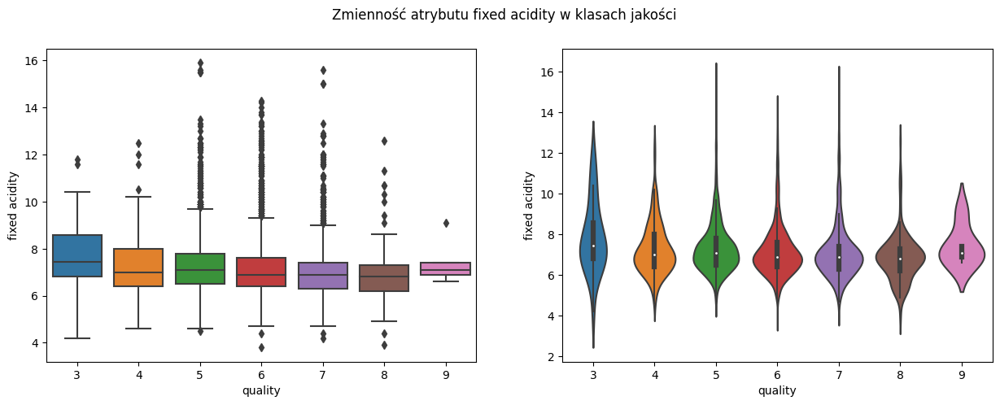

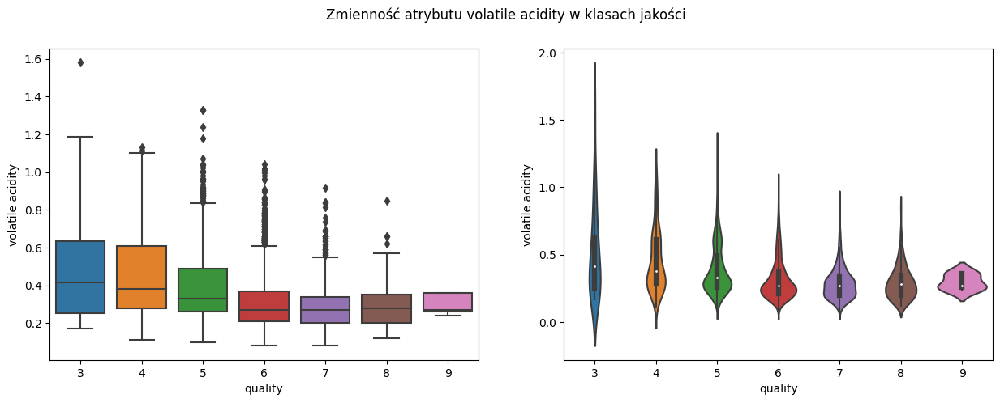

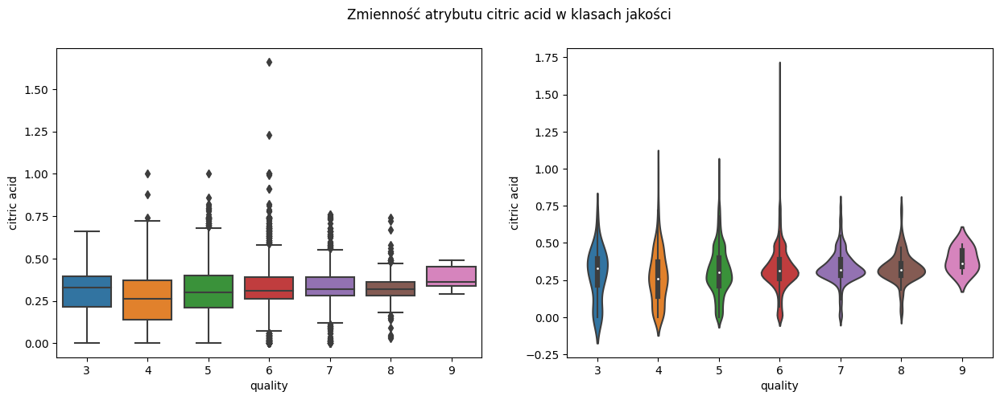

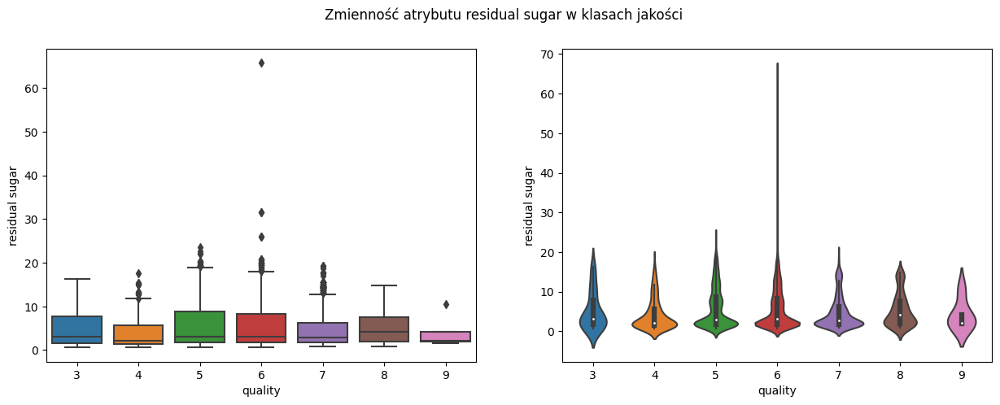

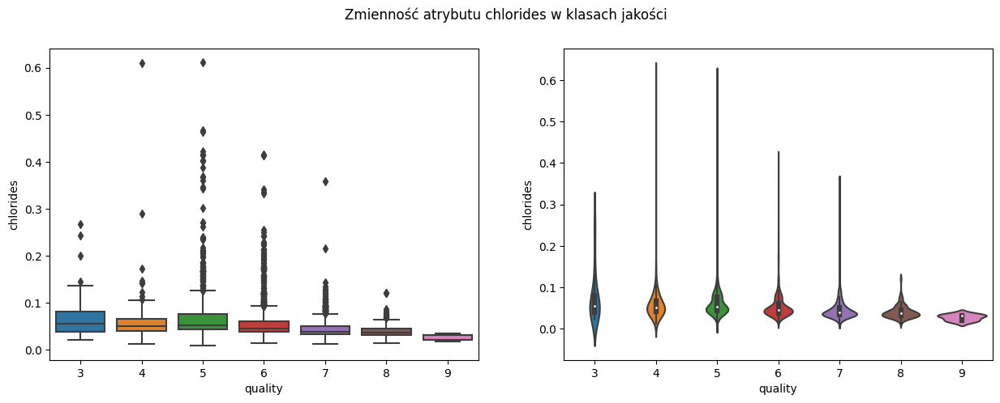

...

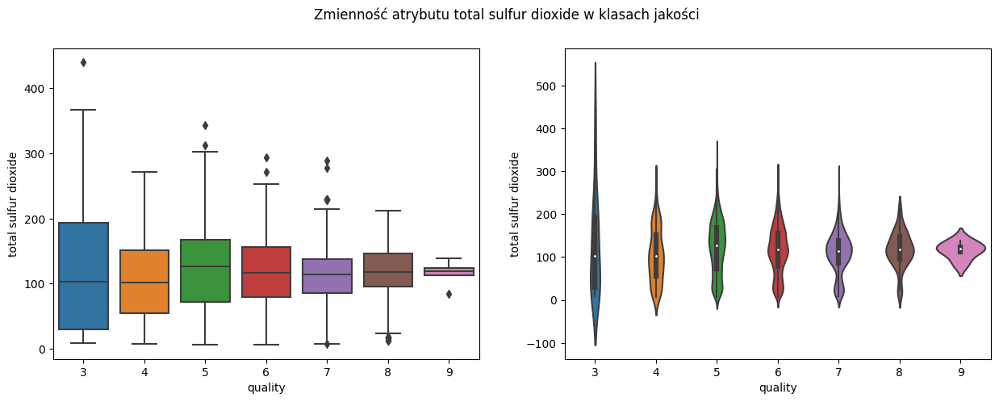

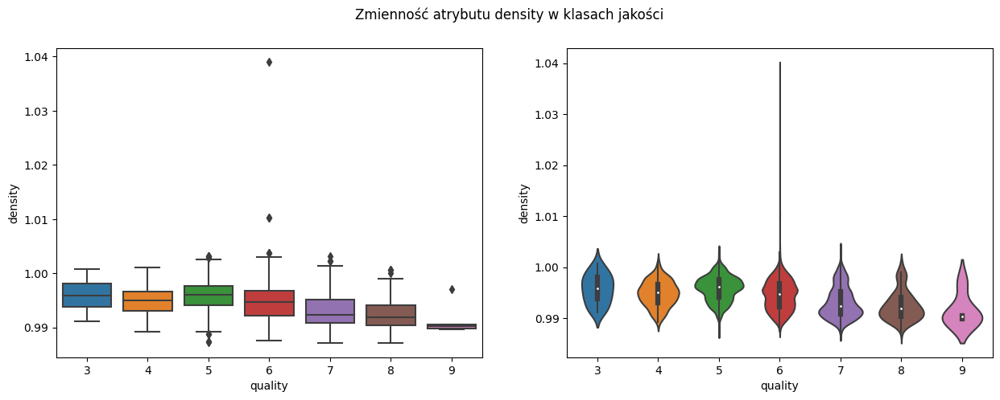

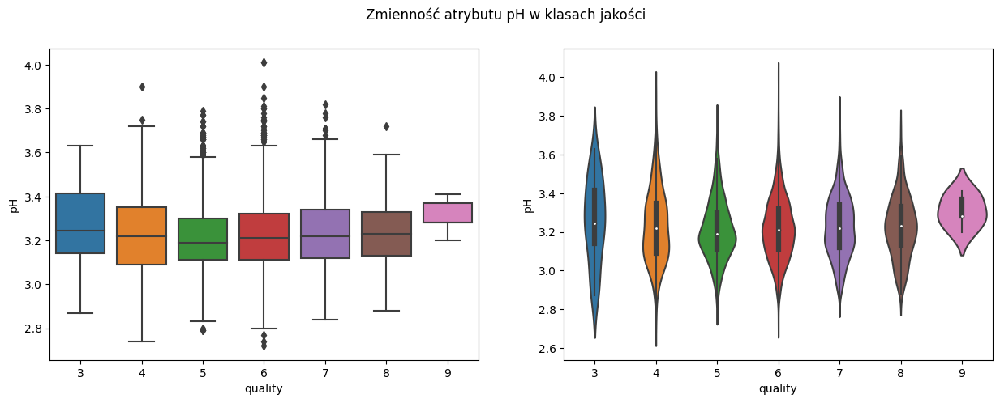

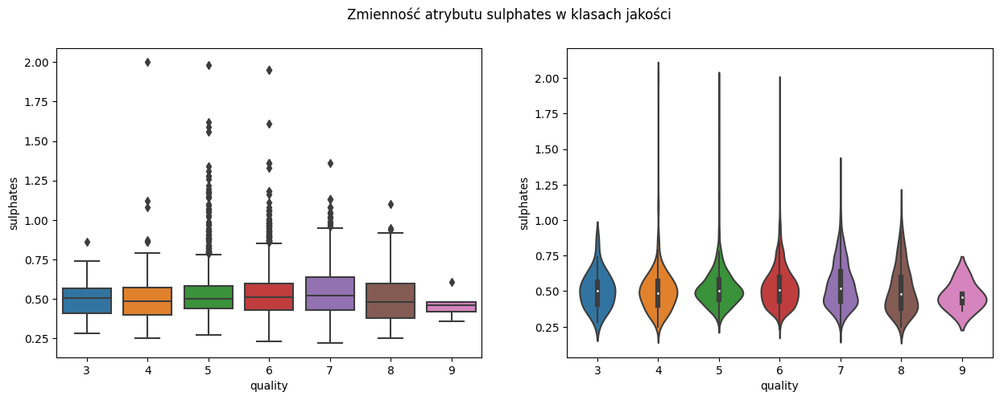

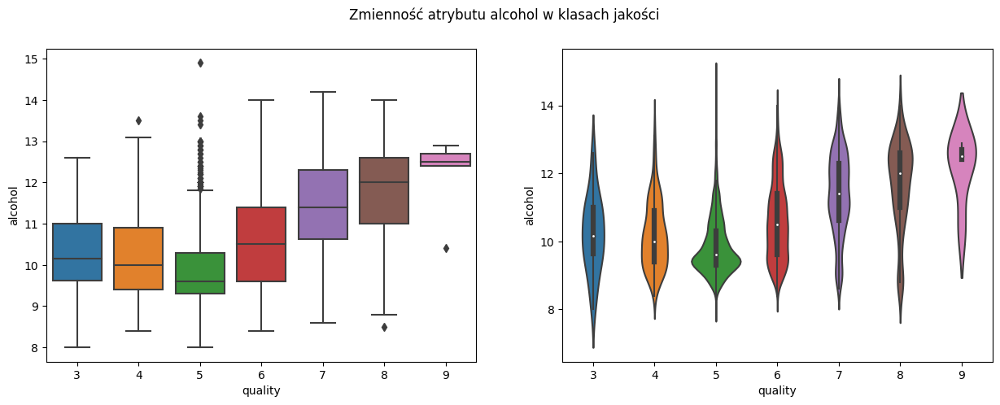

In [12]:
# wyświetlenie zmienności każdego atrybutu w podziale na klasy jakości
for attribute in wines:
    if attribute in ["quality", "color"]:
        continue
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Zmienność atrybutu {attribute} w klasach jakości")
    plt.subplot(1, 2, 1)
    sns.boxplot(data=wines, x="quality", y=attribute)
    plt.subplot(1, 2, 2)
    sns.violinplot(data=wines, x="quality", y=attribute)
    plt.show()

W celu analizy zmienności danych, wyświetliliśmy wykresy pudełkowe i skrzypcowe dla kolejnych atrybutów. Na osi X umieściliśmy kolejne klasy jakości win, a na osi Y określiliśmy poszczególne atrybuty.

* Im niższa jest klasa jakości, tym większa jest obserwowana zmienność atrybutów.
* Najwyższa klasa jakości (klasa 9) posiada bardzo małą zmienność atrybutów. Należy jednak pamiętać, że należy do niej zaledwie 5 obiektów.
* Można zaobserwować występowanie punktów oddalonych oznaczających wartości odbiegające znacznie od standardowego przedziału zmienności.
* Atrybut *chlorides* posiada najmniejszą zmienność i jednocześnie odznacza się występowanie dużej liczby punktów oddalonych.
* Atrybuty *alcohol* i *total sulfur dioxide* posiadają największą zmienność w zbiorze danych.
* Wstępna analiza danych pod kątem ich zmienności sugeruje, że najlepszym atrybutem do klasyfikacji może być atrybut *alcohol*, ponieważ jego zmienność w poszczególnych klasach mieści się w nieco innych zakresach wartości.

### Analiza korelacji

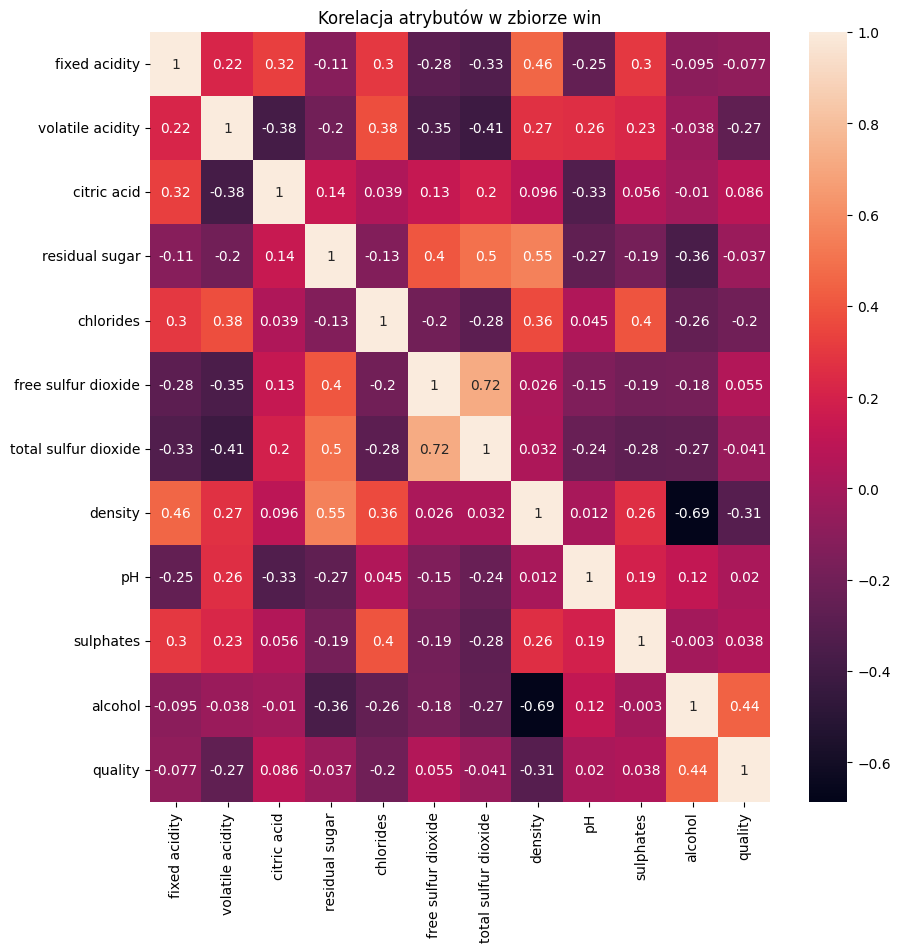

In [13]:
# obliczenie macierzy korelacji
wines_corr = wines.corr()

plt.figure(figsize=(10, 10))
plt.title("Korelacja atrybutów w zbiorze win")
sns.heatmap(wines_corr, annot=wines_corr)
plt.show()

W celu analizy korelacji poszczególnych atrybutów, obliczyliśmy **macierz korelacji**, którą następnie przedstawiliśmy w formie **mapy cieplnej**. Można zauważyć, że atrybuty *total sulfur dioxide* oraz *free sulfur dioxide* są ze sobą **najsilniej skorelowane** (korelacja na poziomie 0,72). **Najsilniej skorelowane ujemnie** są atrybuty *alcohol* i *density* (korelacja na poziomie -0,69). Ogólna analiza macierzy korelacji doprowadziła nas do wniosku, że poza tymi dwoma przypadkami nie ma w zbiorze silnych korelacji. Atrybuty raczej pozostają od siebie niezależne. Nieco większą korelację wykazują jeszcze atrybuty *density* i *residual sugar* oraz *total sulfur dioxide* i *residual sugar*.

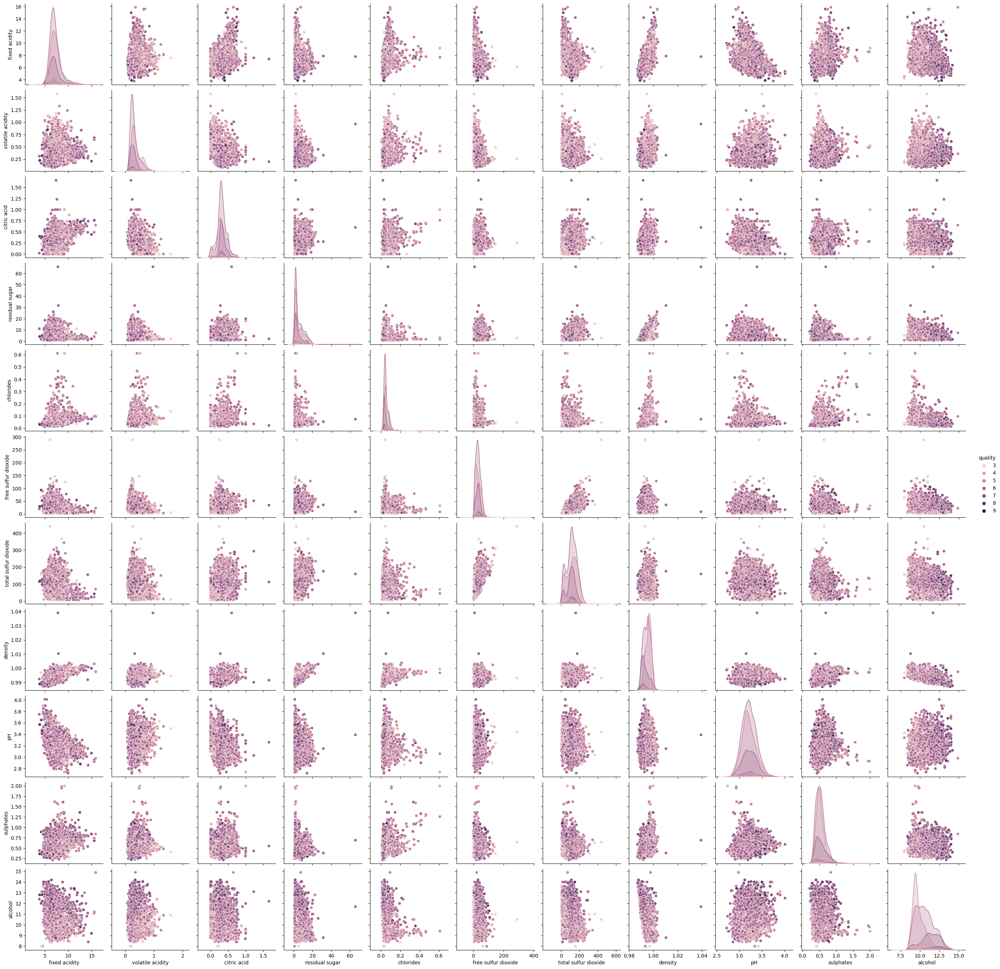

In [43]:
sns.pairplot(wines, hue="quality")
plt.show()

* Analiza macierzy wykresów pozwala potwierdzić wnioski z mapy cieplnej reprezentującej macierz korelacji.
* Wykresy punktowe wykazują istnienie pewnych pojedynczych punktów oddalonych, czyli takich, jakich wartości różnią się zasadniczo od wartości pozostałych punktów tworzących skupiska.
* Analiza histogramów znajdujących się na przekątnej macierzy sugeruje, że najlepszym atrybutem do klasyfikacji win według jakości może być *alcohol*.
* W zbiorze nie ma atrybutów, które pozwalają na jednoznaczne rozdzielenie klas. Grupy punktów z różnych klas są ze sobą wymieszane a histogramy się nakładają na siebie.

### Porównanie zbiorów win czerwonych z białymi

Opierając się na podstawowych miarach statystycznych zbioru **win czerwonych** oraz **win białych** można sformułować następujące wnioski.

* Atrybuty *total sulfur dioxide*, *residual sugar*, *free sulfur dioxide* posiadają, na podstawie mediany, większe wartości dla zbioru **win białych** w stosunku do zbioru **win czerwonych**.
* Atrybuty *fixed acidity* i *volatile acidity* posiadają, na podstawie mediany, większe wartości dla zbioru **win czerwonych** w stosunku do zbioru **win białych**.

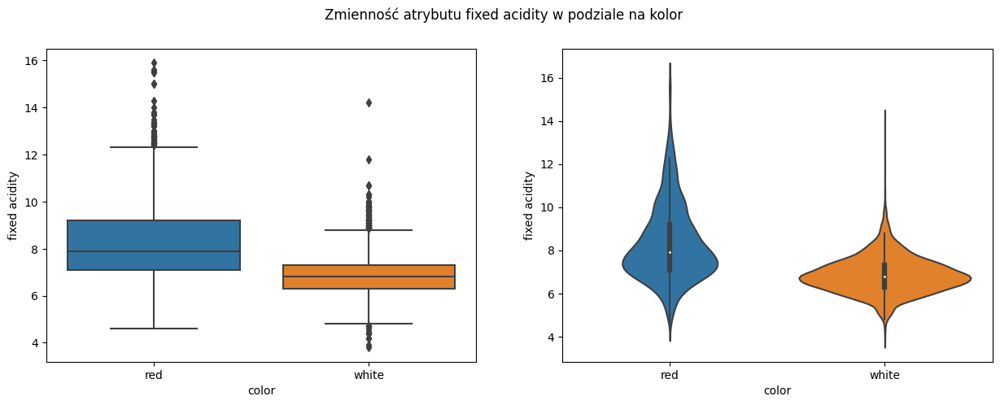

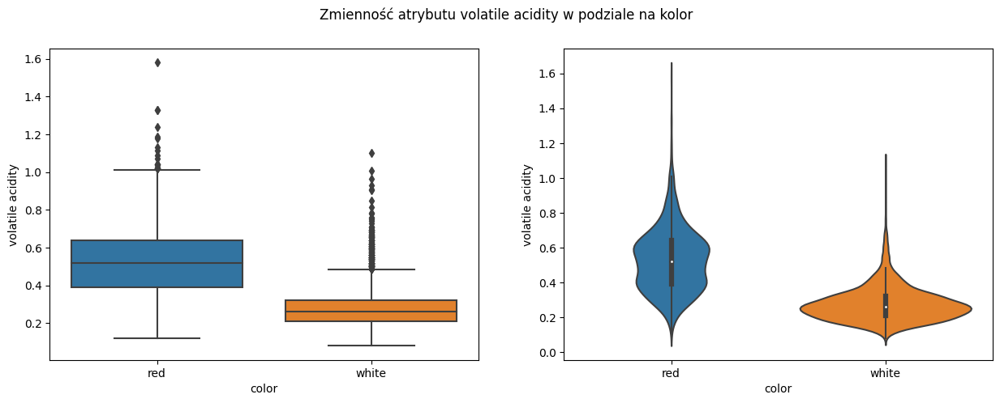

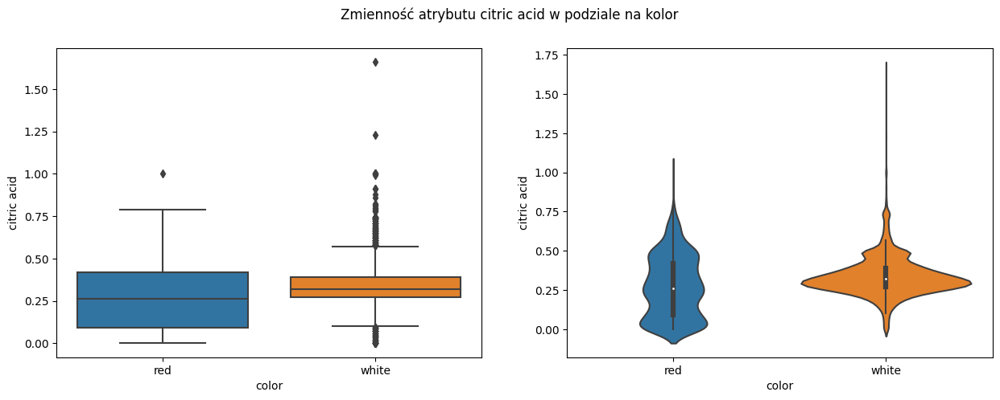

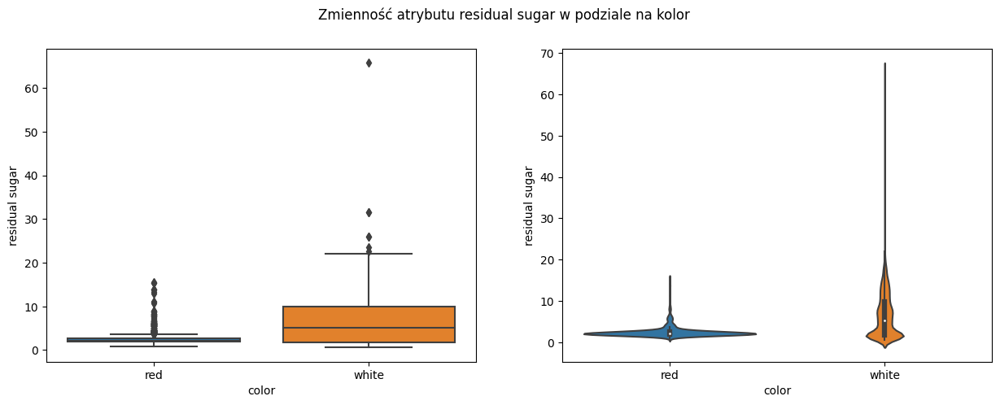

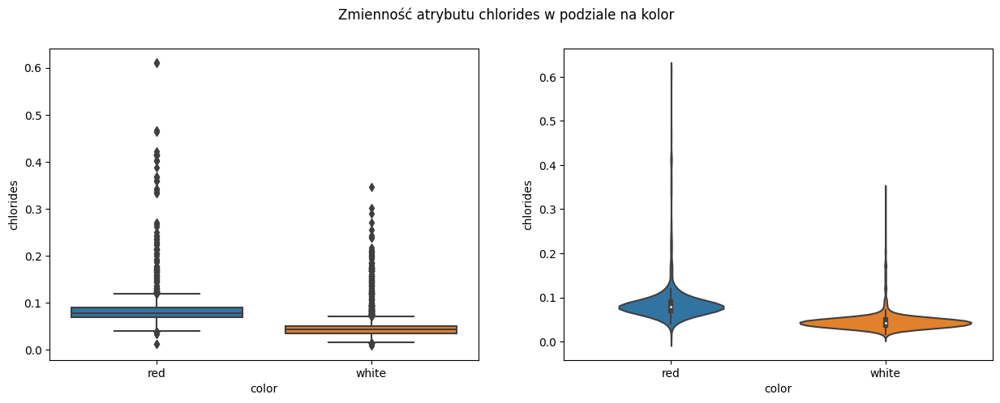

...

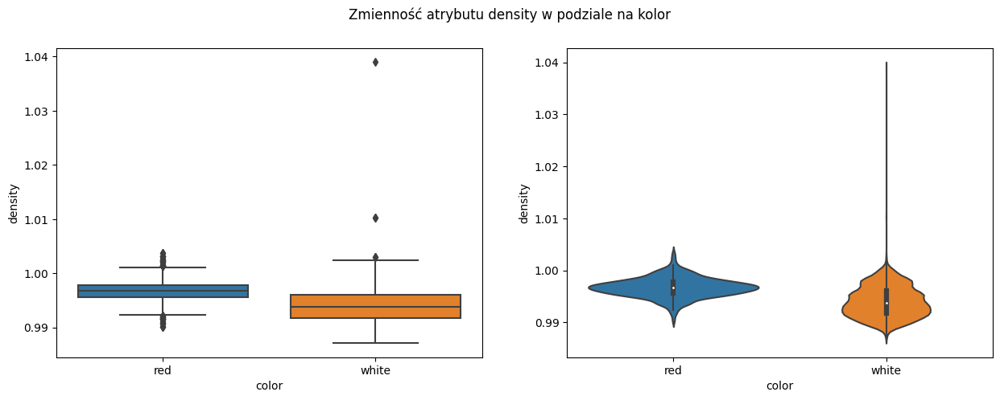

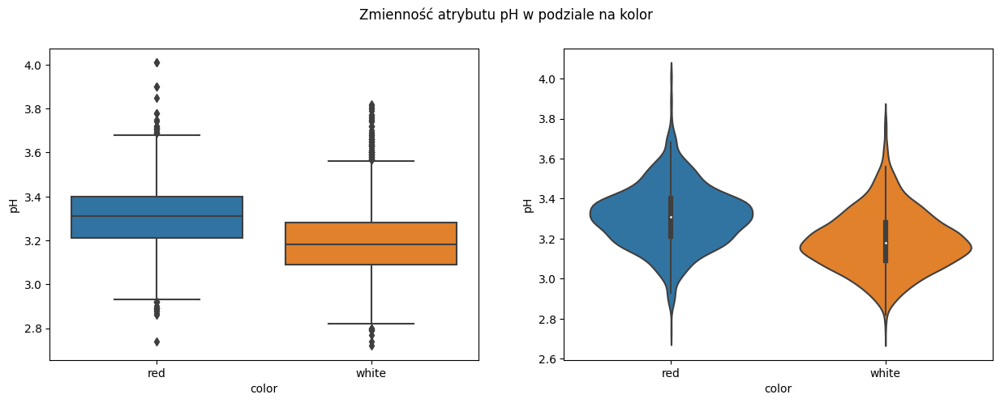

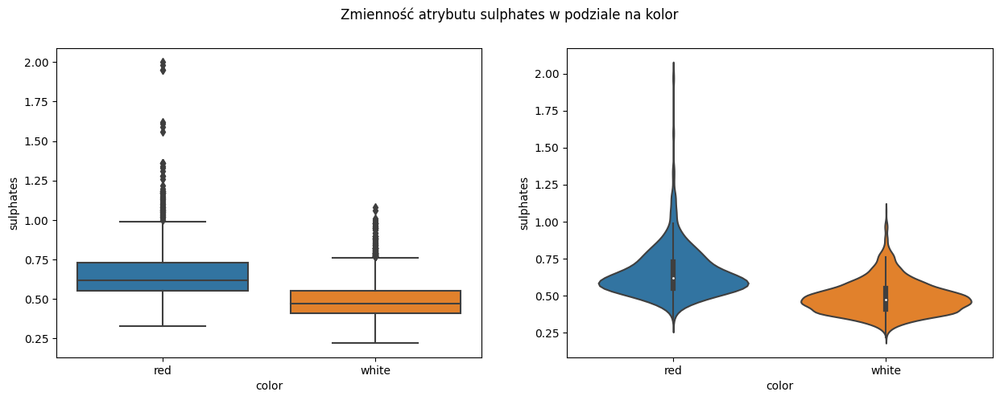

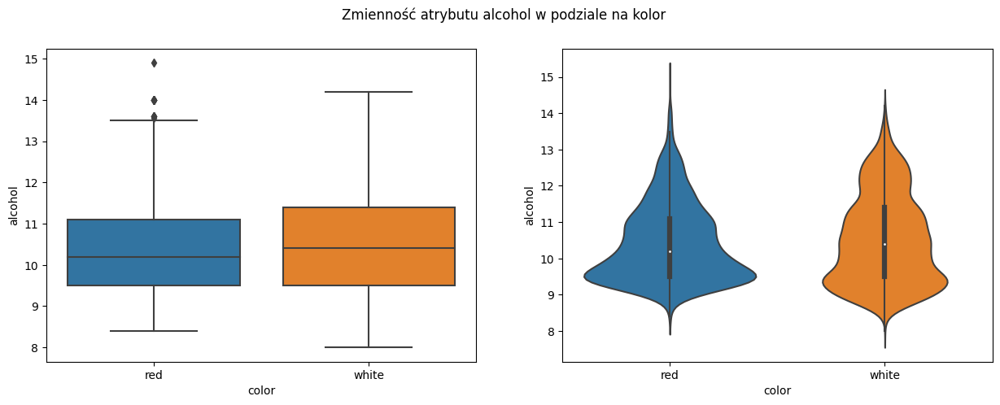

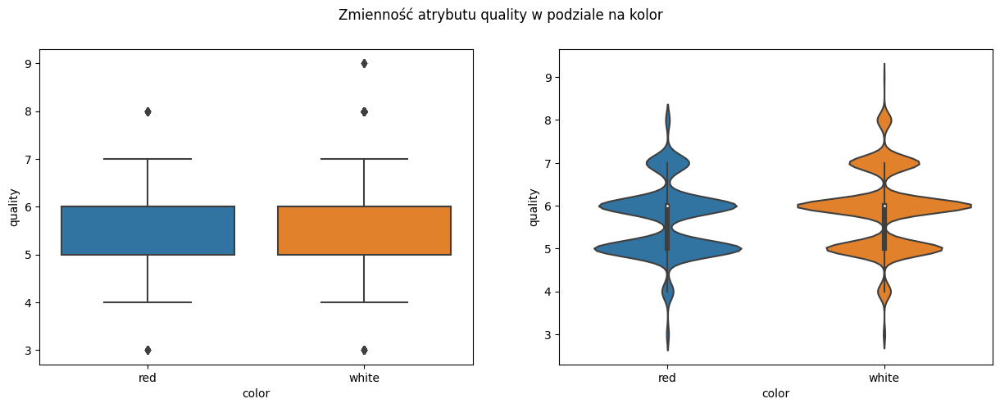

In [5]:
# wyświetlenie zmienności każdego atrybutu w podziale na kolor
for attribute in wines:
    if attribute in ["color"]:
        continue
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Zmienność atrybutu {attribute} w podziale na kolor")
    plt.subplot(1, 2, 1)
    sns.boxplot(data=wines, x="color", y=attribute)
    plt.subplot(1, 2, 2)
    sns.violinplot(data=wines, x="color", y=attribute)
    plt.show()

W celu analizy zmienności danych, wyświetliliśmy wykresy pudełkowe i skrzypcowe dla kolejnych atrybutów. Na osi X umieściliśmy kolory win, a na osi Y określiliśmy poszczególne atrybuty. Zostało to zastosowane, aby zobaczyć, czy któreś atrybuty w pewnych przedziałach są charakterystyczne dla danego koloru. Na tej podstawie nasuwają się poniższe wnioski.

* Jeśli atrybut *fixed acidity* jest na poziomie około **7,5** lub większym to jest większe prawodpodobieństwo, że dane wino będzie należało do zbioru **win czerwonych**. 
* Jeśli atrybut *volatile acidity* jest na poziomie około **0,4** lub większym to jest większe prawodpodobieństwo, że dane wino będzie należało do zbioru **win czerwonych**. 
* Jeśli atrybut *residual sugar* jest na poziomie około **4** lub większym to jest większe prawodpodobieństwo, że dane wino będzie należało do zbioru **win białych**.
* Jeśli atrybut *chlorides* jest na poziomie około **0,8** lub większym to jest większe prawodpodobieństwo, że dane wino będzie należało do zbioru **win czerwonych**.
* Jeśli atrybut *total sulfur dioxide* jest na poziomie około **100** lub większym to jest większe prawodpodobieństwo, że dane wino będzie należało do zbioru **win białych**.
* Atrybut *critic acid* ma znacznie większe skupienie występowanie w okolicach wartości **0,35** dla **win białych**.
* W przypadku atrybutu *alcohol* zakres jego występowania dla obu kolorów jest podobny więc nie jest to dobry atrybut do sklasyfikowania wina do odpowiedniego koloru. Na wykresie wiolinowym można co najwyżej zobaczyć jego większe skupienie w pewnym zakresie, lecz też nie jest ono znacząco inne jak dla drugiego koloru.
*  Pozostałe atrybuty teoretycznie bardziej się wyróżniają na wykresach, ale można uznać, że nie wystarczająco, więc próba przypisania wina do koloru na ich podstawie byłaby wykonana na "siłę".
* Kolor wina nie wpływa znacząco na jego jakość jednak warto zauważyć, że **tylko wina białe** są w klasie jakości **9**.

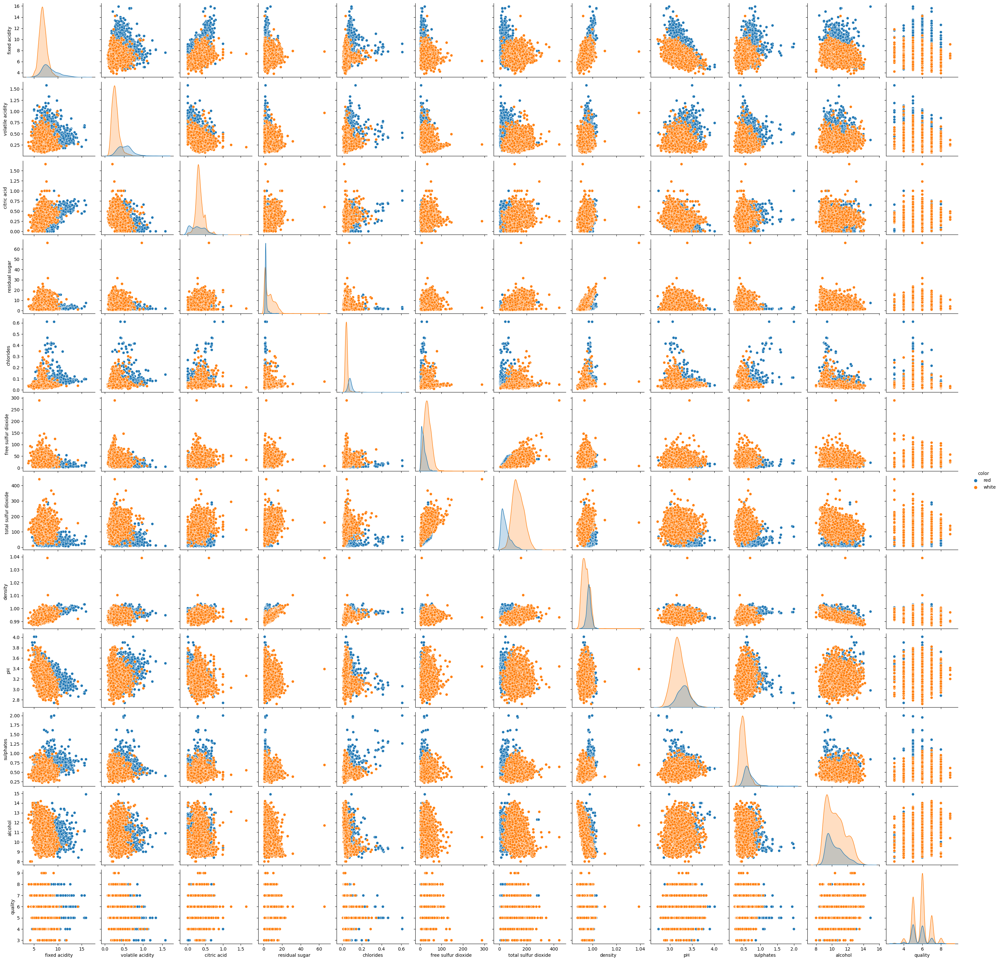

In [6]:
sns.pairplot(wines, hue="color")
plt.show()

* Analiza macierzy wykresów pozwala potwierdzić wnioski wynikające z wykresów zmienności atrybutów w podziale na kolor, w odniesieniu do zakresów występowania wartości niektórych atrybutów dla odpowiednich kolorów.
* Potwierdzają to histogramy znajdujące się na przekątnej macierzy.

### Wnioski z analizy eksploracyjnej

* Oba zbiory win czerwonych oraz białych posiadają te same atrybuty, można zatem te zbiory połączyć w jeden zbiór win.
* W zbiorze nie ma braków danych.
* Dane są typu rzeczywistego i większość z nich zmienia się w podobnym i niewielkim zakresie. Część atrybutów może jednak wymagać technik normalizacji lub standaryzacji przed procesem uczenia maszynowego.
* W zbiorze występują dwa dosyć silnie skorelowane ze sobą atrybuty (*total sulfur dioxide* i *free sulfur dioxide*). Ponadto występują dwa atrybuty skorelowane ujemnie (*alcohol* i *density*).
* Im więcej jest alkoholu w winie, tym mniejsza jest jego gęstość. Alkohol rozrzedza wino.
* *free sulfur dioxide* stanowi składową *total sulfur dioxide*.
* W zbiorze danych nie ma atrybutów, które mogłyby pozwolić na jednoznaczną klasyfikację wina do danej klasy jakości.
* Zakresy wartości niektórych atrybutów są charakterystyczne dla odpowiedniego koloru wina, należą do nich między innymi atrybut *fixed acidity* oraz *volatile acidity* występujące w pewnym zakresie tylko w większości dla **win czerwonych**. 
* Niektóre atrybuty nie mają wpływu na kolor wina, gdyż dla obydwu występują w podobym zakresie. Przykładem takiego atrybutu na danych zbiorach jest *alcohol*.

## Rozwiązanie problemu

### Klasyfikacja jakości win z wykorzystaniem metod uczenia maszynowego

In [4]:
# normalizacja atrybutów total sulfur dioxide oraz free sulfur dioxide
attributes_to_normalize = ["total sulfur dioxide", "free sulfur dioxide"]
normalized_wines_data = wines.drop(columns=["color"])
normalized_wines_data[attributes_to_normalize] = wines[attributes_to_normalize].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

Ze względu na duże wartości atrybutów *total sulfur dioxide* oraz *free sulfur dioxide* w porównaniu do małych wartości pozostałych atrybutów, zdecydowaliśmy się przed przystąpieniem do procesu uczenia na dokonanie operacji **normalizacji**.

In [5]:
# podział zbioru danych na dane uczące i testowe według zadanej proporcji
proportion = 0.3
description_learn_data, description_test_data, decision_learn_data, decision_test_data = train_test_split(normalized_wines_data.iloc[:, 0:-1], normalized_wines_data.iloc[:, -1].astype("category").cat.codes, test_size = proportion)
train_wines_data = {"description_learn_data": description_learn_data, "description_test_data": description_test_data, "decision_learn_data": decision_learn_data, "decision_test_data": decision_test_data}

Zanim przystąpiliśmy do uczenia maszynowego, podzieliliśmy zbiór danych w proporcji **30% do 70%** na dane **testowe i uczące**.

In [6]:
def borders(model, data, x , y, title):
    model.fit(data["description_learn_data"].loc[:, [x, y]], data["decision_learn_data"])
    
    x_min = min(data["description_learn_data"].loc[:, x].min(), data["description_test_data"].loc[:, x].min())
    x_max = max(data["description_learn_data"].loc[:, x].max(), data["description_test_data"].loc[:, x].max())
    y_min = min(data["description_learn_data"].loc[:, y].min(), data["description_test_data"].loc[:, y].min())
    y_max = max(data["description_learn_data"].loc[:, y].max(), data["description_test_data"].loc[:, y].max())
    
    range_x = x_max - x_min
    range_y = y_max - y_min
    
    x_min = x_min - 0.1 * range_x
    x_max = x_max + 0.1 * range_x
    y_min = y_min - 0.1 * range_y
    y_max = y_max + 0.1 * range_y
    
    xx, yy = np.meshgrid(np.arange(x_min, x_max, (x_max - x_min) / 150), np.arange(y_min, y_max, (y_max - y_min) / 150))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    plt.figure(dpi=100, figsize=(15, 10))
    plt.title(title)
    plt.contourf(xx, yy, Z, levels=4, alpha=0.2)
    plt.scatter(data["description_learn_data"].loc[:, x], data["description_learn_data"].loc[:, y], c=data["decision_learn_data"], marker=".")
    plt.scatter(data["description_test_data"].loc[:, x], data["description_test_data"].loc[:, y], c=data["decision_test_data"], marker="x")
    plt.show()

Zdefiniowaliśmy pomocniczą metodę **borders**, której zadaniem jest przeprowadzanie uczenia nadzorowanego dla zadanego modelu i wybranych atrybutów x i y. Następnie prezentuje ona wyniki uczenia i klasyfikacji obiektów na wykresie punktowym. Zaznacza ona również granice obszarów klasyfikacji.

In [7]:
def verify(model, data, x, y, title):
    model.fit(data["description_learn_data"].loc[:, [x, y]], data["decision_learn_data"])
    learn_data_results = model.predict(data["description_learn_data"].loc[:, [x, y]])
    test_data_results = model.predict(data["description_test_data"].loc[:, [x, y]])
    confusion_matrix_learn_data = metrics.confusion_matrix(data["decision_learn_data"], learn_data_results)
    plt.figure(figsize=(15, 5))
    plt.suptitle(title)
    plt.subplot(1, 2, 1)
    plt.title(f"Zbiór uczący, dokładność: {np.sum(np.diag(confusion_matrix_learn_data)) / np.sum(confusion_matrix_learn_data)}")
    sns.heatmap(confusion_matrix_learn_data, annot=confusion_matrix_learn_data, fmt="g")
    confusion_matrix_test_data = metrics.confusion_matrix(data["decision_test_data"], test_data_results)
    plt.subplot(1, 2, 2)
    plt.title(f"Zbiór testowy, dokładność: {np.sum(np.diag(confusion_matrix_test_data)) / np.sum(confusion_matrix_test_data)}")
    sns.heatmap(confusion_matrix_test_data, annot=confusion_matrix_test_data, fmt="g")
    plt.show()

Kolejna metoda pomocnicza to **verify**, która weryfikuje skuteczność uczenia i klasyfikacji. Wyświetla ona w tym celu macierz pomyłek dla zbioru uczącego i testowego oraz wylicza współczynnik dokładności uczenia dla obu tych zbiorów.

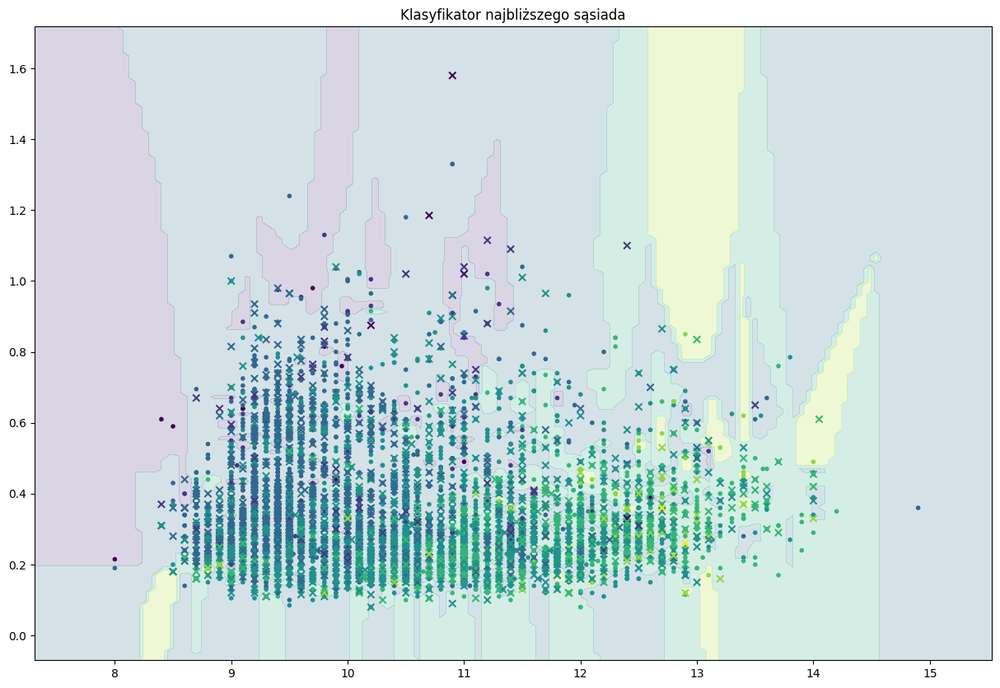

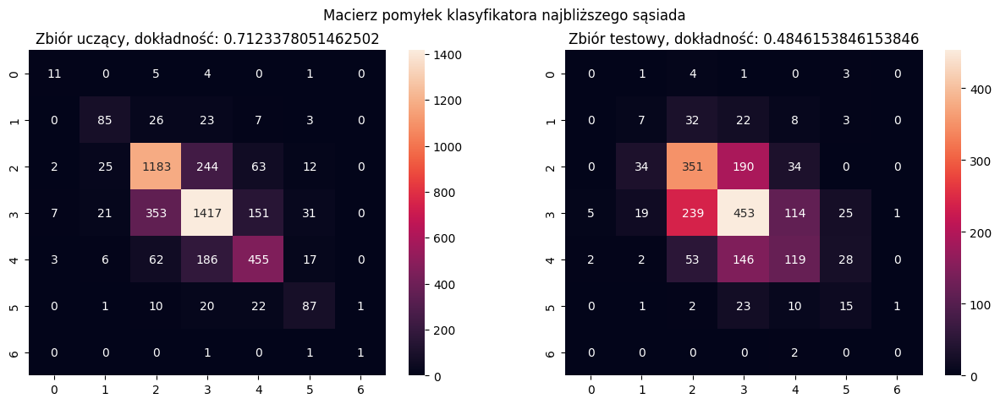

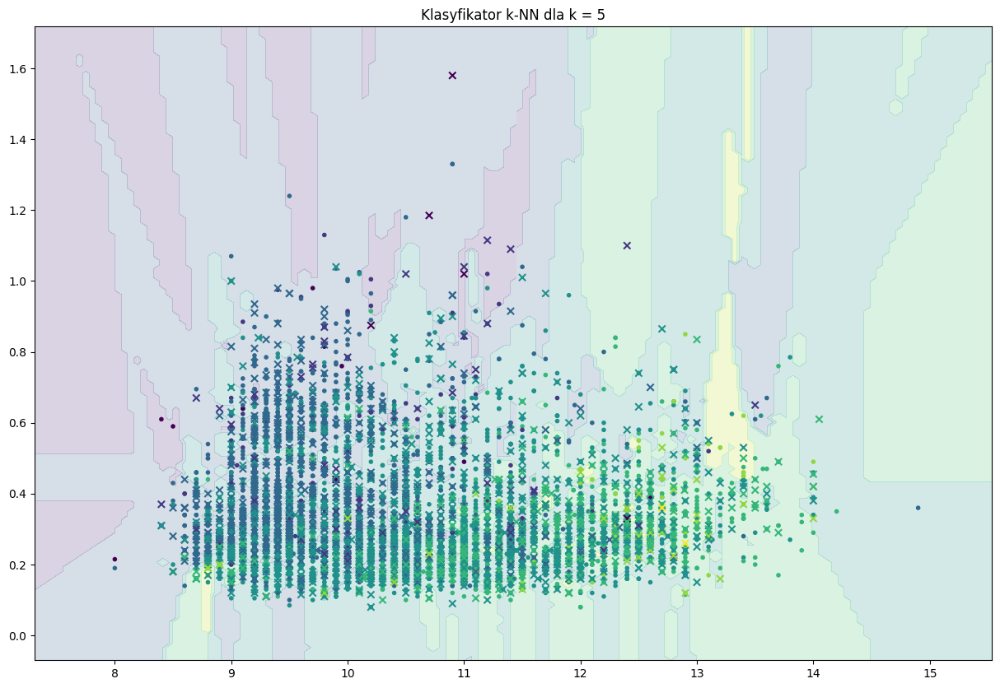

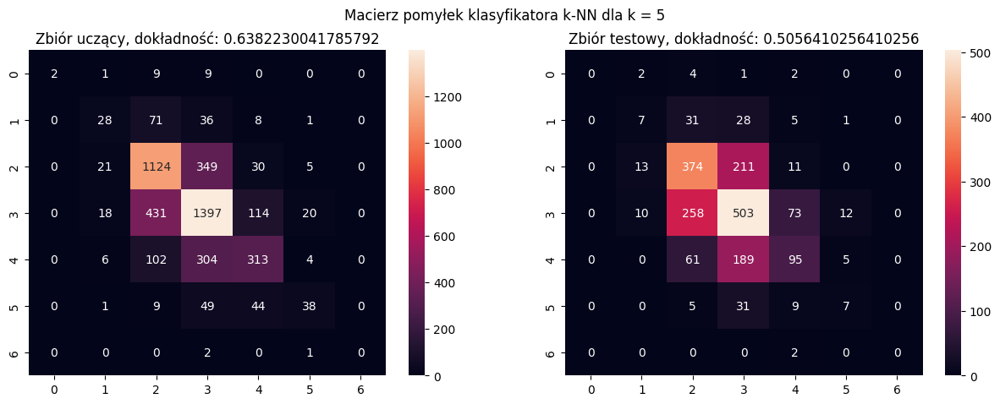

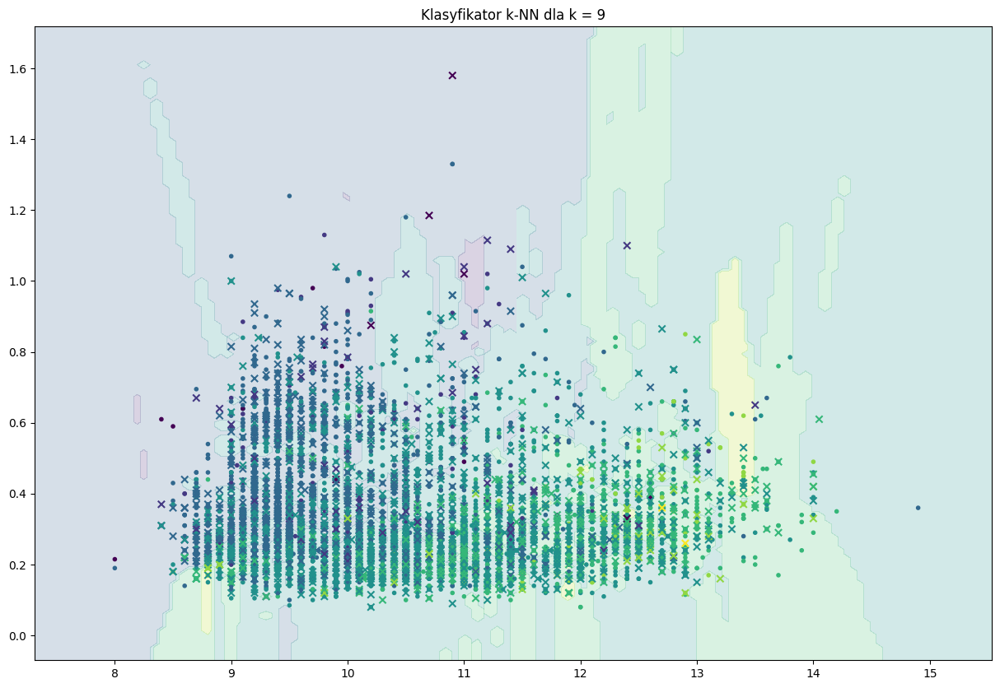

...

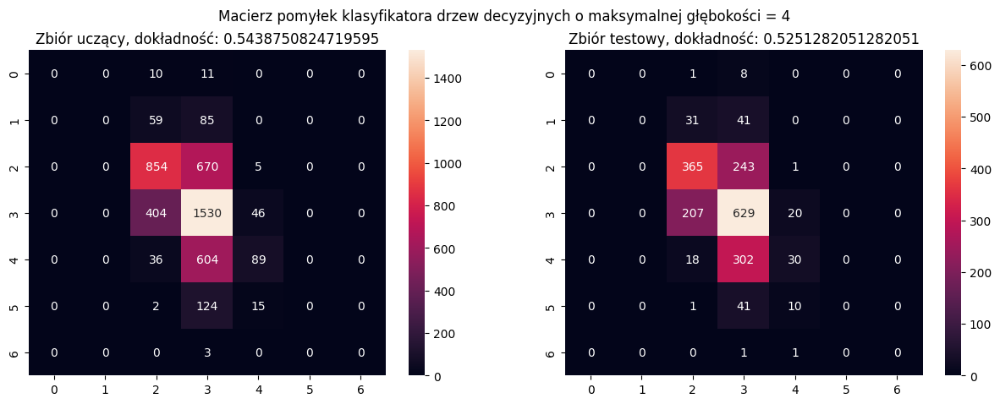

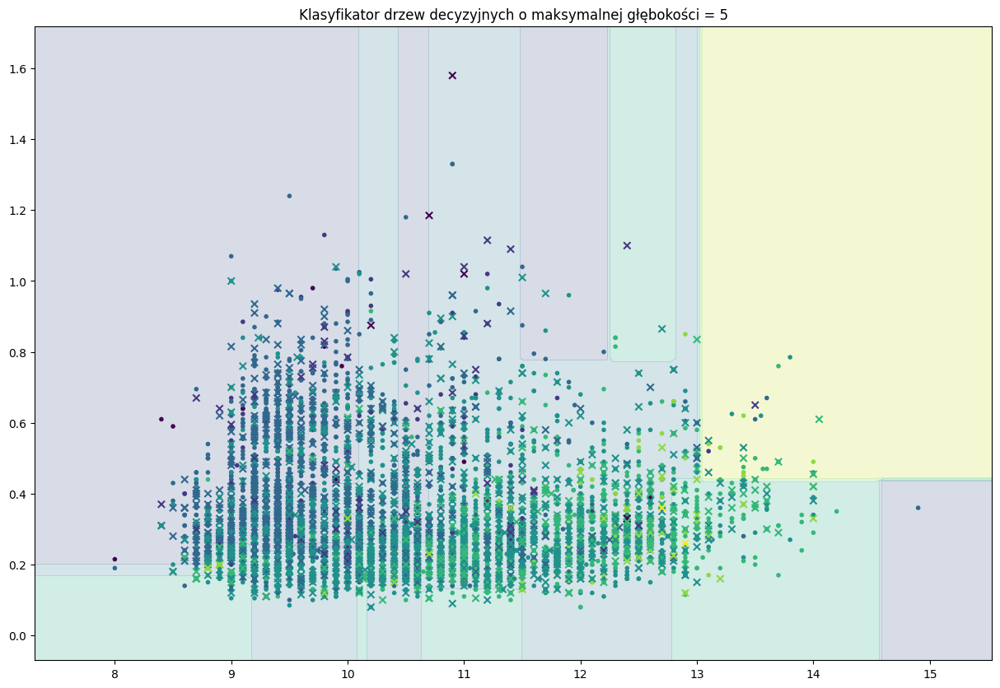

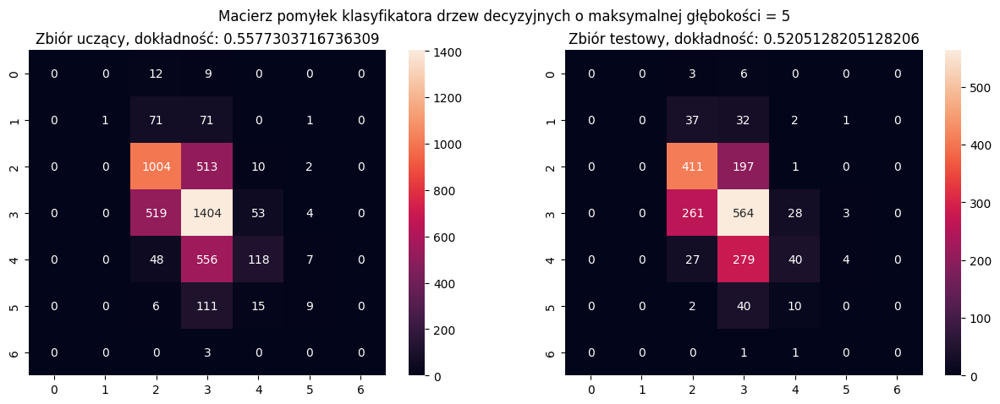

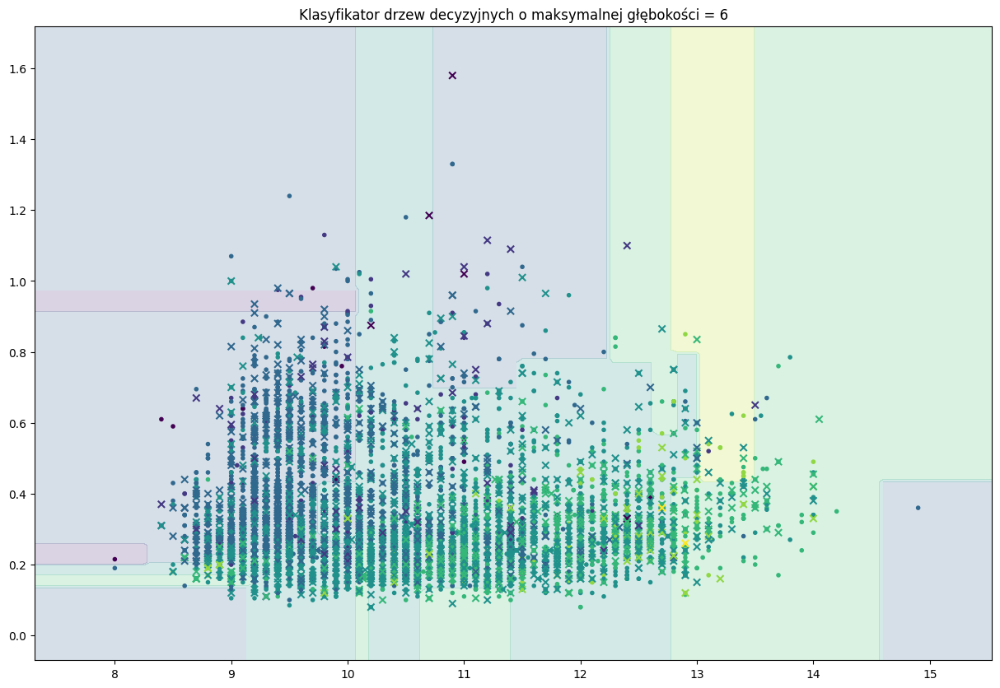

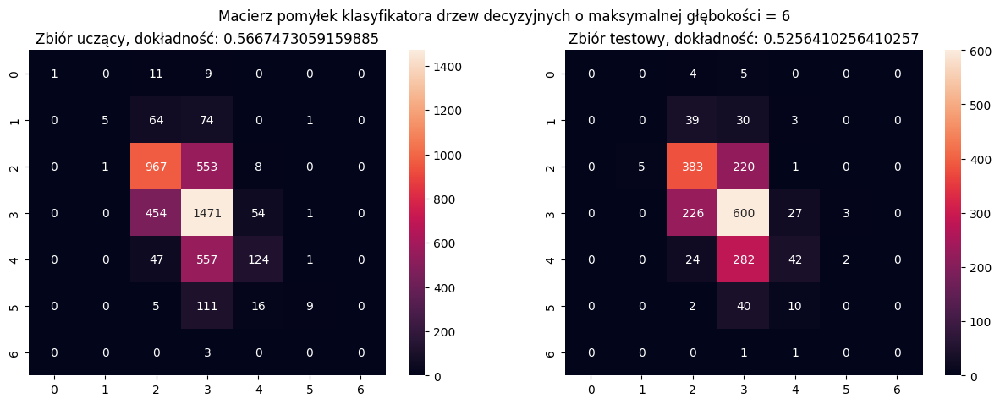

In [8]:
x_attribute = "alcohol"
y_attribute = "volatile acidity"

# klasyfikator k-NN
k_values = [1, 5, 9]
for k in k_values:
    model = KNeighborsClassifier(n_neighbors=k)
    borders_title = f"Klasyfikator k-NN dla k = {k}"
    verify_title = f"Macierz pomyłek klasyfikatora k-NN dla k = {k}"
    if k == 1:
        borders_title = "Klasyfikator najbliższego sąsiada"
        verify_title = "Macierz pomyłek klasyfikatora najbliższego sąsiada"
    borders(model, train_wines_data, x_attribute, y_attribute, borders_title)
    verify(model, train_wines_data, x_attribute, y_attribute, verify_title)
    
# klasyfikator najbliższego prototypu
model = NearestCentroid()
borders(model, train_wines_data, x_attribute, y_attribute, "Klasyfikator najbliższego prototypu")
verify(model, train_wines_data, x_attribute, y_attribute, "Macierz pomyłek klasyfikatora najbliższego prototypu")

# klasyfikator naiwny Bayesa
model = GaussianNB()
borders(model, train_wines_data, x_attribute, y_attribute, "Klasyfikator naiwny Bayesa")
verify(model, train_wines_data, x_attribute, y_attribute, "Macierz pomyłek klasyfikatora naiwnego Bayesa")

# klasyfikator drzew decyzyjnych
tree_depths = [4, 5, 6]
for tree_depth in tree_depths:
    model = DecisionTreeClassifier(max_depth=tree_depth)
    borders(model, train_wines_data, x_attribute, y_attribute, f"Klasyfikator drzew decyzyjnych o maksymalnej głębokości = {tree_depth}")
    verify(model, train_wines_data, x_attribute, y_attribute, f"Macierz pomyłek klasyfikatora drzew decyzyjnych o maksymalnej głębokości = {tree_depth}")

### Sposób rozwiązania problemu

Zdecydowaliśmy się zastosować techniki uczenia nadzorowanego ze względu na obecność w zbiorze danych atrybutu decyzyjnego (klasa jakości wina - atrybut *quality*). Przed przystąpieniem do procesu samego uczenia dokonaliśmy jeszcze **normalizacji** atrybutów *total sulfur dioxide* i *free sulfur dioxide*. Potem podzieliliśmy zbiór danych na zbiór uczący i testowy w proporcjach **70% do 30%**. Następnie zdefiniowaliśmy dwie metody pomocnicze do wyświetlania wyników klasyfikacji w formie wykresów punktowych i map pomyłek. Sam proces uczenia wykonaliśmy dla algorytmów: **k-NN**, **naiwnego Bayesa**, **najbliższego prototypu** oraz **drzew decyzyjnych**. Do uczenia maszynowego wybraliśmy atrybuty *alcohol* oraz *volatile acidity*, ponieważ nie są one skorelowane ze sobą i po analizie macierzy wykresów punktowych wraz z histogramami można stwierdzić, że dane atrybuty mają największą zdolność do rozdzielania klas. Mimo wszystko sprawdziliśmy wyniki dokładności uczenia dla różnych par atrybutów i lepszych rezultatów nie udało nam się uzyskać.

### Uzyskane wyniki

* Uzyskano **słabe wyniki uczenia**, które oscylują głównie w zakresie **od 50 do 60% skuteczności**.
* **Najsłabsze wyniki** uzyskano dla klasyfikatora **najbliższego prototypu** (wyniki oscylujące wokół **35%**).
* **Najlepsze wyniki** otrzymano w przypadku klasyfikatora **najbliższego sąsiada** (około **70%**). Jednak skuteczność tego klasyfikatora **dla zbioru testowego** to już zaledwie około **50%**.

## Opis działania programu i przebiegu analizy

Sposób działania programu oraz przebieg analizy można opisać w następującyh krokach.

1. Najpierw zostały zaimportowane wszytkie niezbędne pakiety, aby program działał prawidłowo.
2. Następnie nastąpiło wczytanie danych z plików i wyświetlenie, jak te zbiory wyglądają. 
3. Następym krokiem było wykonanie **analizy eksploracyjnej** począwszy od wyświetlenia **struktury zbiorów**. Sklada się na to określenie ilości oraz typów atrybutów, jak i zarówno wyznaczenie liczby dnaych brakującyh.
4. Kolejnym krokiem analizy było połączenie obu zbiorów danych w jeden zbiór win z atrybutem określającym kolor, określenie wielkości zbioru oraz ilości klas jakości.
5. W dalszej części analizy zbadano **zmienność atrybutów i podstawowe miary statystyczne** dla zbioru wina czerwonego, białego jak i połączonego zbioru wszystkich win oraz wysunięto odpowiednie wnioski.
6. Następnie poddano analizie i zwizualizowano zmienność każdego atrybutu w podziale jakości i opisano zaobserwowane zależności.
7. W kolejnym kroku **zbadano korelacje** w zbiorze win poprzez obliczenie i zwizualizowanie macierzy korelacji dla tego zbioru i zapisanie obserwacji na jej podstawie. Wraz z macierzą korelacji zwizualizowano macierz wykresów punktowych i przeanalizowano wpływ atrybutów na rozdzielenie klas.
8. Później przystąpiono do **porównania zbiorów win czerwonych z białymi**. Wykorzystano do tego miary statystyczne z podpunktu **5** oraz wizualizacje zmienności każdego atrybutu z podziałem na kolor. Wnioski z obserwacji zapisano.
9. W nastepnym etapie określono **wnioski wynikające z analizy eksploracyjnej**.
10. Kolejnym krokiem było rozwiązanie problemu zaczynając od **klasyfikacji jakości win z wykorzystaniem metod uczenia maszynowego**.
11. Proces ten rozpoczęto od normalizacji atrybutów *total sulfur dioxide* oraz *free sulfur dioxide* ze względu na ich duże wartości.
12. Następnie podzielono w proporcjach 70% do 30% zbiór na dane uczące i testowe.
13. Potem zdefiniowano dwie funkcje pomocnicze, które służą do wyświetlania rezultatów uczenia nadzorowanego.
14. Następnie przeprowadzono uczenie maszynowe korzystając z algorytmów: k-NN, naiwnego Bayesa, drzew decyzyjnych i najbliższego prototypu.
15. Na podstawie uzyskanych wyników wyciągnięto odpowiednie wnioski.

## Wnioski końcowe

* Zarówno zbiór win czerwonych jak i białych posiadają 11 atrybutów typu rzeczywistego oraz jeden *quality*, który jest atrybutem decyzyjnym i określa, w której klasie jakości, od 3 do 9, jest wino. Dlatego zostały połączone w jeden zbiór, dodając atrybut określający kolor.
* Ustalono, że zdecydowana większość win należy do przeciętnych, średnich klas. Tylko niewielka ich część znajduje się w klasach skrajnych.
* Win białych jest kilka razy więcej więc wpływają znaczaco na podstawowe miary statystyzcne dla wspólnego zbioru.
* Atrybuty posiadają większą zmienność w niższych klasach wina.
* Atrybuty *total sulfur dioxide* oraz *free sulfur dioxide* są ze sobą **najsilniej skorelowane** (korelacja na poziomie 0,72). **Najsilniej skorelowane ujemnie** są atrybuty *alcohol* i *density* (korelacja na poziomie -0,69). Nie jest to jednak na tyle wysoka korelacja, aby móc odrzucić jeden z tych atrybutów.
* Nauczanie maszynowe przyniosło bardzo słabe rezultaty, zatem przygotowany model uczenia maszynowego nie nadaje się do praktycznego zastosowania.
* Brak atrybutów, które są w stanie w wyraźny sposób rozdzielać poszczególne klasy jakości, może świadczyć o subiektywnym przydziale klas jakości.

# Źródła

* Materiały udostępnione w ramach zajęć labolatoryjnych z Podstaw Reprezentacji i Analizy Danych.
* Zbiór danych uzyskano ze strony: https://archive.ics.uci.edu/ml/datasets/Wine+Quality
* Dokumentacje pakietów zastosowanych w ramach realizacji projektu.